# 2. Konlp, LSA
 - java 설치
 - Jpype1 설치
 - konlpy 설치

## 형태소 분석
 - konlpy는 Hannanum, Kkma, Twitter, Komoran 형태소 분석기를 지원한다. 여기서는
 - Komoran을 사용한다

In [1]:
from konlpy.tag import Komoran

In [2]:
tagger = Komoran()

In [8]:
text = "한국어로 텍스트를 분석해 봅시다."

In [9]:
tagger.pos(text) # 형태소 분석

[('한국어', 'NNP'),
 ('로', 'JKB'),
 ('텍스트', 'NNG'),
 ('를', 'JKO'),
 ('분석', 'NNG'),
 ('하', 'XSV'),
 ('아', 'EC'),
 ('보', 'VX'),
 ('ㅂ시다', 'EF'),
 ('.', 'SF')]

### 명사만 빼기.

In [10]:
tagger.nouns(text)

['한국어', '텍스트', '분석']

In [20]:
[ noun for noun,posx in tagger.pos(text) if "NN" in posx]

['한국어', '텍스트', '분석']

## 한국어 Term-Document Matrix 만들기

In [6]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

In [22]:
def get_noun(text):
    nouns = tagger.nouns(text)
    return [n for n in nouns if len(n) > 1] # 2글자 이상만

In [23]:
cv = CountVectorizer(tokenizer=get_noun, max_features=100) # 100개의 단어를 2자 이상 단어 명사만 추출.

In [26]:
df = pd.read_csv("no_contents.csv")
df.head(1)

,category,date,href,number,president,sub_category,title,contents
0,국정전반,2003.02.25,?spMode=view&catid=c_pa02062&artid=1309347,780,노무현,취임사,제16 대 대통령 취임사,\r\r\n\t\t\t\t\t\t존경하는 국민 여러분.오늘 저는 대한민국의 제16대...


In [27]:
tdm = cv.fit_transform(df.ix[:5,'contents'])

In [29]:
tdm # 6개 글중 100개 단어를 뽑아서 

<6x100 sparse matrix of type '<class 'numpy.int64'>'
	with 350 stored elements in Compressed Sparse Row format>

## 빈도순 단어 보기

In [30]:
import numpy as np 

In [31]:
words = cv.get_feature_names()
count_mat = tdm.sum(axis=0)

In [32]:
count = np.squeeze(np.asarray(count_mat))

In [33]:
count

array([ 5, 16,  7,  4,  8, 13,  6,  8, 16,  4, 58,  5, 12,  4,  6, 11,  4,
        4,  4,  9,  4, 10,  6,  5,  5, 12,  5,  4,  4, 10,  6, 16, 11,  7,
        5,  5, 30,  6,  8,  9,  4,  6,  9,  7,  6, 15, 15,  4,  5, 12,  8,
       29,  7,  5,  4, 25,  4, 28,  8,  7,  5, 11, 16,  4,  9,  5,  5,  7,
        6,  8, 10,  4,  5,  5,  8,  6,  5,  9, 12,  6,  8, 10,  4,  5,  6,
        4,  4,  5, 11,  5,  5,  6,  6,  7, 40,  4, 25, 12, 14,  4], dtype=int64)

In [35]:
word_count = list(zip(words,count))
word_count = sorted(word_count, key=lambda x:x[1], reverse=True)
word_count[:5]

[('국민', 58), ('평화', 40), ('동북아', 30), ('사회', 29), ('시대', 28)]

### WordCloud

In [36]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
%matplotlib inline

In [37]:
wc = WordCloud(font_path='C:\\Windows\\Fonts\\malgun.ttf', background_color='white', width=400, height=300)
cloud = wc.generate_from_frequencies(dict(word_count))

(-0.5, 399.5, 299.5, -0.5)

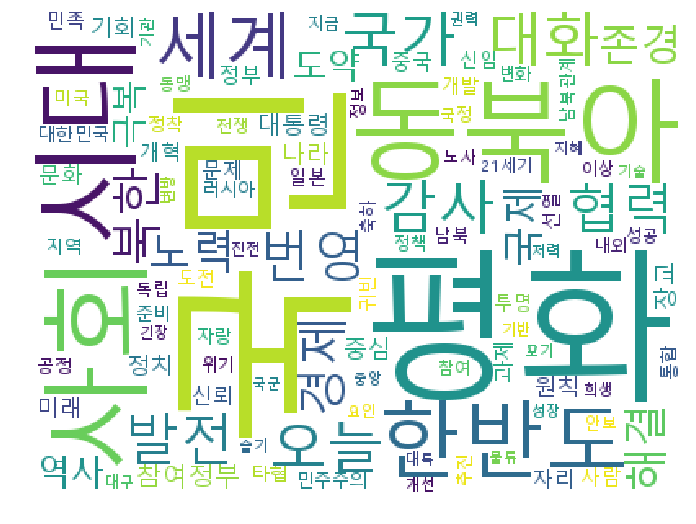

In [38]:
plt.figure(figsize=(12,9))
plt.imshow(cloud)
plt.axis("off")

# Latent Semantic Analysis (LSA)
 - 잠재변수(latent variable)
  - 종교 시설이 많은 도시가 범죄도 많다.
  - 가설1: 종교 -> 범죄
  - 가설2: 범죄 -> 종교
  - 가설3: (제3의 변수) -> 종교 / 범죄
  - 예) 인구가 많으면 종교 시설도 많고 범죄도 많이 일어난다.

## 잠재 의미 분석
 - 의미 -> 단어
![png](TEXTMINING/2.PNG)
![png](TEXTMINING/3.PNG)
![png](TEXTMINING/4.PNG)

## Term-Document-Matrix
![png](TEXTMINING/5.PNG)
![png](TEXTMINING/6.PNG)

## 차원 축소를 하는 이유
 - 문서들이 단어가 아닌 의미상으로 재배치
 - 동음이의어, 오탈자 등(어느정도) 정리됨.
 - 문서에 존재하는 noise가 줄어 더 잘 준류됨.

## 워드 임베딩
 - 단어를 숫자 형태로 만들어버린다. 

In [39]:
from sklearn.decomposition import TruncatedSVD

In [40]:
svd = TruncatedSVD() # Dimensionality reduction 기본으로 2개의 차원으로 축소.

In [41]:
pos = svd.fit_transform(tdm.T)

In [42]:
len(pos)

100

In [44]:
words = [word for word,_ in word_count]
words[:10]

['국민', '평화', '동북아', '사회', '시대', '세계', '한반도', '감사', '국가', '대화']

In [45]:
pos[:10]

array([[ 4.08910077, -2.40999873],
       [ 6.36693896,  0.86677773],
       [ 3.57685327, -0.42153047],
       [ 2.65889949, -1.50439741],
       [ 4.57058392, -0.35963021],
       [ 7.22479173, -2.48962258],
       [ 2.93494361,  0.60436928],
       [ 4.54789648, -0.06079144],
       [ 7.52363887,  0.91609089],
       [ 0.8678872 ,  1.05494951]])

In [46]:
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] = [12, 9]

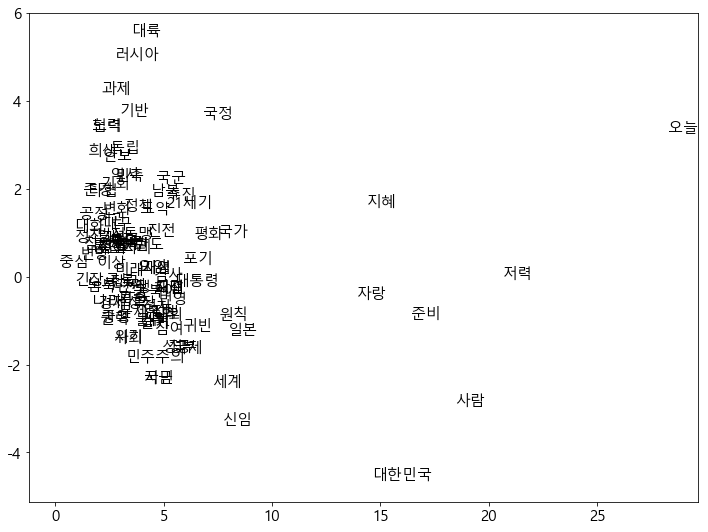

In [47]:
ax = plt.gca()
plt.scatter(pos[:, 0], pos[:, 1], marker='.', color='white')
for i, word in enumerate(words):
    ax.text(pos[i, 0], pos[i, 1], word)

# Cosine similarity & Clustering

In [74]:
from sklearn.metrics.pairwise import cosine_similarity

In [48]:
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import Normalizer
from sklearn.pipeline import make_pipeline

In [53]:
cv = CountVectorizer(tokenizer=get_noun, max_features=500) # 100개의 단어를 2자 이상 단어 명사만 추출.

In [54]:
tdm = cv.fit_transform(df.ix[:200,'contents'])

In [55]:
svd = TruncatedSVD(n_components=10) # 10개의 차원으로 변경.

In [56]:
svd

TruncatedSVD(algorithm='randomized', n_components=10, n_iter=5,
       random_state=None, tol=0.0)

In [57]:
pos = svd.fit_transform(tdm)

In [58]:
pos.shape

(201, 10)

In [59]:
pos[0, :]

array([ 36.59515026, -20.41011133, -10.26753273,   9.23727561,
        -7.36627941,  -1.68983502,  13.22500519,  -4.11650636,
        -1.99189422,   0.46663831])

### 정규화
 - 길이도 정보를 가지고 있는데 왜 줄이느냐 라는 비판도 있다.
 - 보통 많이 사용한다.
 - 다른걸 한다고 해서 크게 좋아지는건 없다...

In [60]:
normalizer = Normalizer(copy=False)
lsa = make_pipeline(svd, normalizer) 

In [61]:
pos = lsa.fit_transform(tdm)
pos.shape

(201, 10)

In [62]:
pos[0, :]

array([ 0.78047691, -0.43529334, -0.21897595,  0.19704228, -0.15713139,
       -0.03608921,  0.28151525, -0.08671924, -0.04134748,  0.01122457])

In [63]:
sum(pos[0, :] ** 2)

0.99999999999999989

### 코사인 유사도 

In [81]:
words = cv.get_feature_names()

In [ ]:
cosine_similarity_list = []
for i in range(len(pos)):
    for j in range(i+1, len(pos)):
        cosine_similarity_list.append((i,j, cosine_similarity(pos[i,:],pos[j,:])))

C:\Anaconda3\envs\work\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Anaconda3\envs\work\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Anaconda3\envs\work\lib\site-packages\sklearn\utils\validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C

### 클러스터링
 - 1차로 임의의 점으로 cluster 갯수로 해서 가까운 놈들로 나눈다.
 - cluster 에 나누어진 놈들끼리 평균을 구하면 다시 중심을 구할 수 있다.
 - 또 다시 평균을 내서 중심을 잡는다.
 - 그리고 점들을 중심에서의 거리를 구하고 가까운 놈들에게 포함시키게 한다.
 - 변화가 없을때 까지 돌린다.

In [64]:
from sklearn.cluster import KMeans

In [65]:
km = KMeans(n_clusters=5)

In [66]:
km.fit(pos)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [67]:
km.labels_

array([4, 1, 4, 4, 3, 4, 1, 4, 4, 4, 4, 2, 1, 3, 4, 1, 4, 0, 3, 0, 4, 4, 4,
       4, 3, 3, 1, 4, 4, 4, 0, 4, 1, 0, 4, 1, 0, 4, 3, 4, 2, 3, 3, 2, 3, 1,
       3, 0, 4, 0, 0, 0, 0, 0, 2, 4, 1, 4, 2, 1, 4, 0, 2, 2, 3, 0, 0, 0, 0,
       0, 0, 1, 2, 0, 4, 4, 3, 3, 4, 3, 3, 3, 4, 0, 0, 3, 0, 0, 2, 1, 3, 0,
       4, 4, 3, 4, 4, 3, 3, 4, 3, 1, 0, 0, 2, 0, 1, 1, 3, 2, 0, 0, 3, 2, 1,
       1, 0, 4, 2, 3, 1, 0, 0, 4, 1, 2, 1, 0, 3, 3, 3, 3, 2, 4, 3, 3, 3, 3,
       1, 3, 1, 3, 3, 0, 1, 1, 3, 2, 1, 3, 0, 1, 2, 3, 3, 3, 1, 1, 1, 3, 2,
       3, 2, 4, 2, 4, 1, 1, 4, 2, 3, 3, 3, 1, 2, 3, 0, 3, 1, 3, 3, 1, 4, 0,
       2, 1, 2, 1, 3, 3, 4, 0, 1, 4, 1, 3, 2, 1, 1, 1, 4])

 - 내용으로 보기엔 내용이 길다.

In [72]:
df.ix[0,'title']

'제16 대 대통령 취임사'

In [73]:
df.ix[2,'title']

'제16 대통령 취임 축하 외빈을 위한 만찬사'